In [1]:
# @title
### EP2 MAC0417 / MAC5768
##################################################################
# AO PREENCHER ESSE CABEÇALHO COM O MEU NOME E O MEU NÚMERO USP, #
# DECLARO QUE SOU O ÚNICO AUTOR E RESPONSÁVEL PELA RESOLUÇÃO     #
# DESTE EP.                                                      #
# TODAS AS PARTES FORAM DESENVOLVIDAS E IMPLEMENTADAS POR MIM,   #
# SEGUINDO AS INSTRUÇÕES E QUE PORTANTO, NÃO CONSTITUEM          #
# DESONESTIDADE ACADÊMICA OU PLÁGIO.                             #
#                                                                #
# DECLARO TAMBÉM, QUE SOU RESPONSÁVEL POR TODAS AS CÓPIAS        #
# DESSE PROGRAMA, E QUE EU NÃO DISTRIBUI OU FACILITEI A          #
# SUA DISTRIBUIÇÃO. ESTOU CIENTE QUE OS CASOS DE PLÁGIO E        #
# DESONESTIDADE ACADÊMICA SERÃO TRATADOS SEGUNDO OS CRITÉRIOS    #
# DEFINIDOS NO CÓDIGO DE ÉTICA DA USP.                           #
#                                                                #
# ENTENDO QUE JUPYTER NOTEBOOKS SEM ASSINATURA NÃO SERÃO         #
# CORRIGIDOS E, AINDA ASSIM, PODERÃO SER PUNIDOS POR             #
# DESONESTIDADE ACADÊMICA.                                       #
#                                                                #
#                                                                #
# Nome: Matheus Sanches Jurgensen                                #
# NUSP: 12542199                                                 #
# Turma: MAC0417                                                 #
# Prof.: Ronaldo Fumio                                           #
##################################################################

# EP2 MAC0417 - Notebook 2
Nome: Matheus Sanches Jurgensen \
NUSP: 12542199

## Importing the Necessary Libraries

In [2]:
import numpy as np
import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt

## Applying Histogram Equalization

Agora, aplica-se a Equalização do Histograma em cada uma das imagens em augmentedDataset.

### Defining the Necessary Methods

In [3]:
def histogram_equalization(image_path):
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Image file '{image_path}' not found.")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)
    Y, U, V = cv2.split(image)
    Y_eq = equalize_hist(Y)
    image_eq = cv2.merge((Y_eq, U, V))
    image_eq = cv2.cvtColor(image_eq, cv2.COLOR_YUV2BGR)
    return image_eq

def equalize_hist(channel):
    histogram = np.bincount(channel.flatten(), minlength=256)
    total_pixels = channel.size
    normalized_histogram = histogram / total_pixels
    cumulative_histogram = np.cumsum(normalized_histogram)
    transformation_map = np.floor(255 * cumulative_histogram).astype(np.uint8)
    eq_img_channel = transformation_map[channel]
    return eq_img_channel

In [4]:
def applyHistogramEqualization(input_folder: str, output_folder: str):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    metadata_path = os.path.join(input_folder, "metadata.csv")
    metadata = pd.read_csv(metadata_path)
    updated_metadata = []

    for _, row in metadata.iterrows():
        image_name = row['Nome_da_Imagem']
        input_path = os.path.join(input_folder, image_name)
        output_path = os.path.join(output_folder, image_name)
        new_img = histogram_equalization(input_path)
        cv2.imwrite(output_path, new_img)
        image_size = os.path.getsize(output_path)
        row['Image_Size'] = image_size
        updated_metadata.append(row)
    
    updated_metadata_df = pd.DataFrame(updated_metadata)
    updated_metadata_path = os.path.join(output_folder, 'metadata.csv')
    updated_metadata_df.to_csv(updated_metadata_path, index=False)

In [5]:
def apply_equalization_to_subfolders(root_folder, output_root_folder):
    for root, dirs, _ in os.walk(root_folder):
        for dir_name in dirs:
            input_folder_path = os.path.join(root, dir_name)
            relative_path = os.path.relpath(input_folder_path, root_folder)
            output_folder_path = os.path.join(output_root_folder, relative_path)
            applyHistogramEqualization(input_folder_path, output_folder_path)

### Calling the Methods

In [6]:
path_augmented_folder = "./images/augmentedDataset"
path_output_folder = "./images/normalizedDataset"
apply_equalization_to_subfolders(path_augmented_folder, path_output_folder)

## Seeing the Histograms

### Implementing the Necessary Methods

In [12]:
def process_main_folder(main_folder):
    '''
    Main function to iterate over each folder and subfolders
    '''
    histograms_dict = {}
    for folder in os.listdir(main_folder):
        if folder == "originalDataset":
            continue
        folder_path = os.path.join(main_folder, folder)
        if os.path.isdir(folder_path):
            subfolders = [f.path for f in os.scandir(folder_path) if f.is_dir()]
            if subfolders:
                for subfolder in subfolders:
                    compute_histograms(subfolder, histograms_dict, os.path.basename(folder_path))
            else:
                compute_histograms(folder_path, histograms_dict)
    return histograms_dict

def compute_histograms(folder_path, histograms_dict, parent_folder=None):
    csv_file = os.path.join(folder_path, 'metadata.csv')
    metadata = pd.read_csv(csv_file)
    groups = metadata.groupby(['Local', 'Periodo'])

    for group_name, group_data in groups:
        images = []
        histograms = []
        for _, row in group_data.iterrows():
            image_filename = row['Nome_da_Imagem']
            image_path = os.path.join(folder_path, image_filename)
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            histogram = compute_histogram_of_image(image)
            images.append(image)
            histograms.append(histogram)
        
        average_histogram = np.mean(histograms, axis=0)

        folder_name = os.path.basename(folder_path)
        if parent_folder:
            folder_name = f"{parent_folder}/{folder_name}"
        if group_name not in histograms_dict:
            histograms_dict[group_name] = []
        histograms_dict[group_name].append((folder_name, average_histogram, images[-1]))

def compute_histogram_of_image(image):
    image_np = np.array(image)
    if image_np.ndim == 3 and image_np.shape[2] == 3:
        gray_img = cv2.cvtColor(image_np, cv2.COLOR_BGR2GRAY)
    else:
        gray_img = image_np
    hist, _ = np.histogram(gray_img, bins=256, range=(0, 256))
    return hist

### Plotting the Histograms

======================================== ('Dentro', 'Dia') ========================================


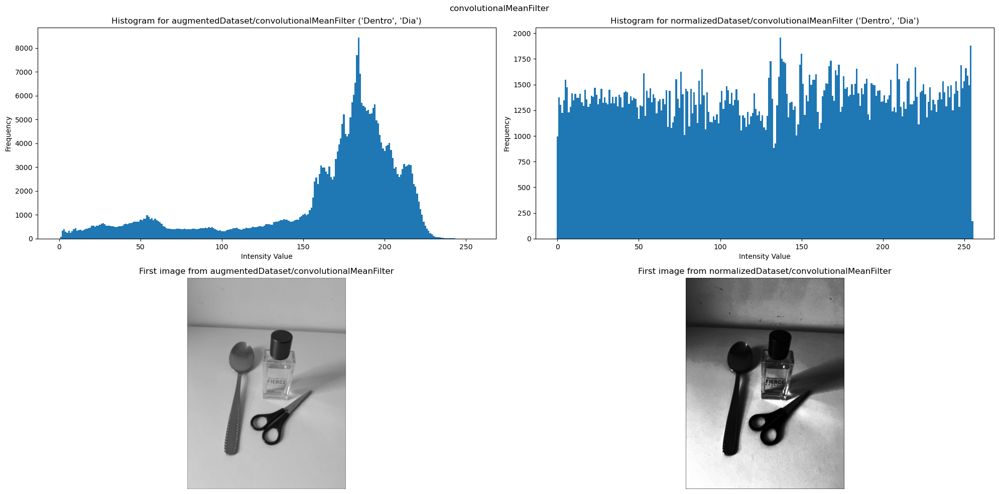

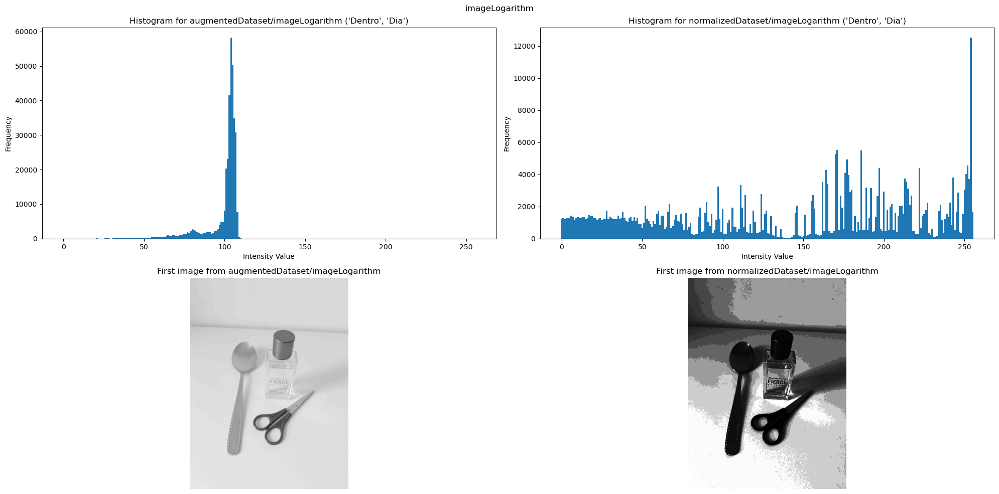

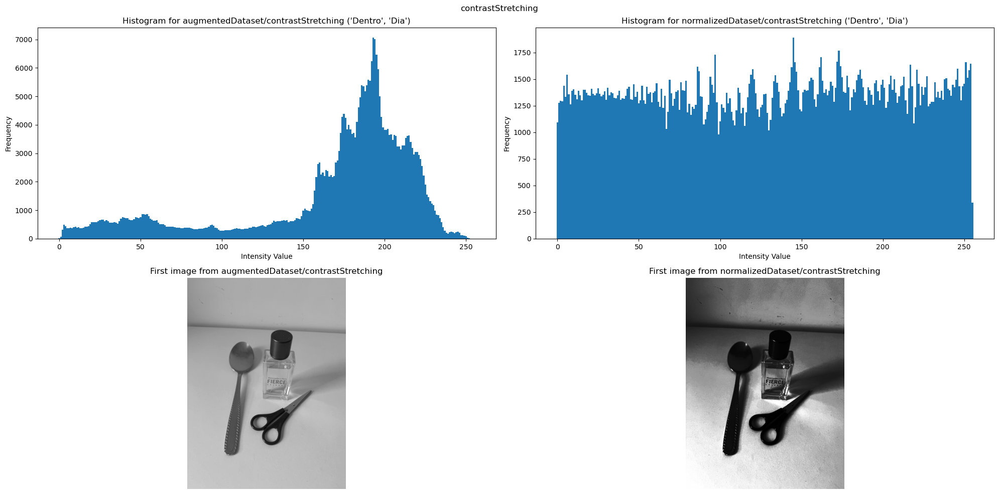

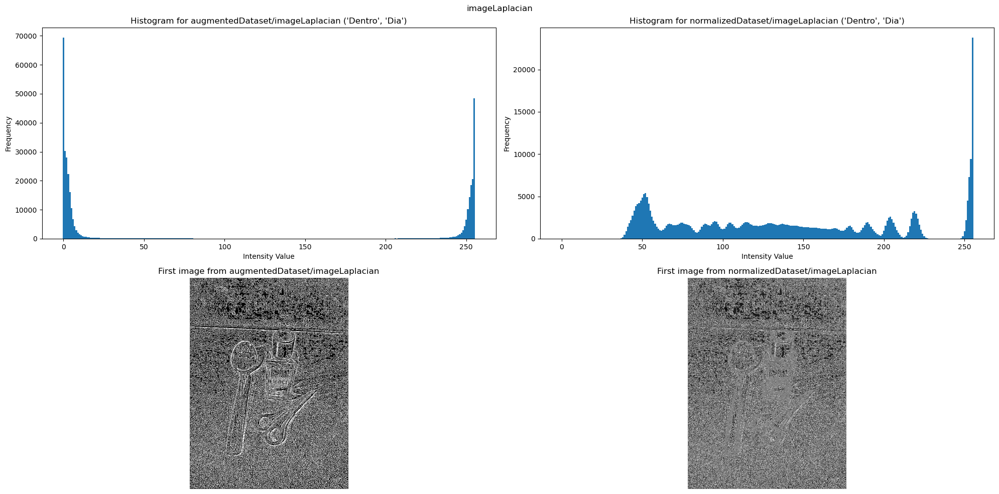

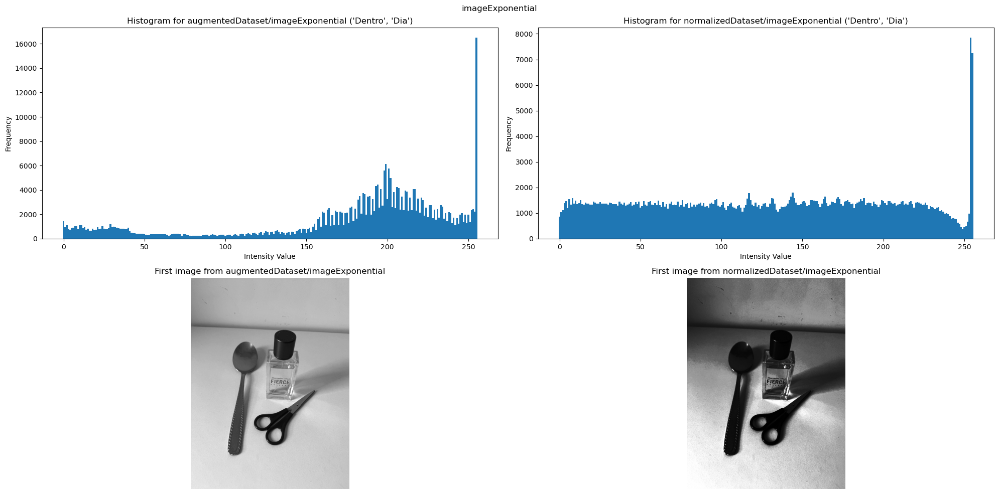

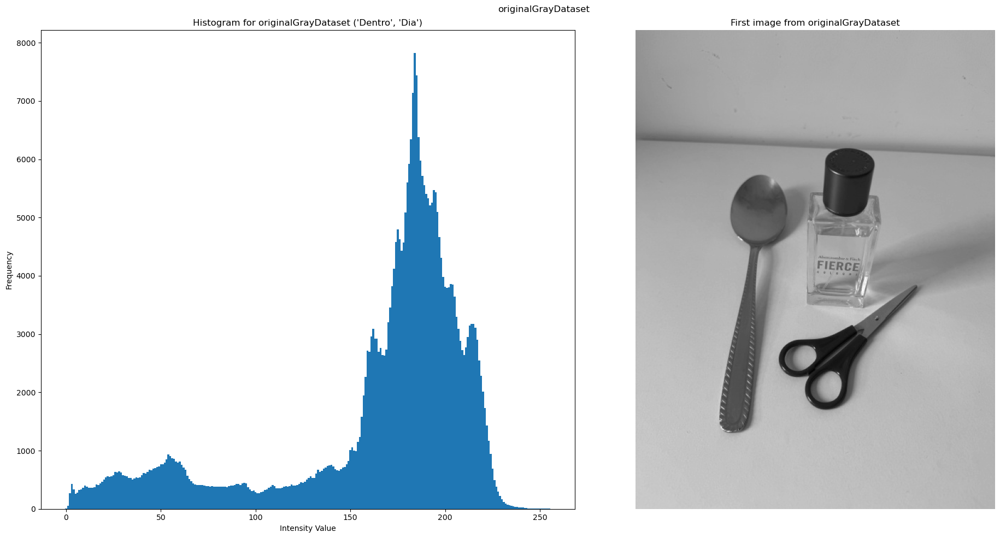

======================================== ('Dentro', 'Noite') ========================================


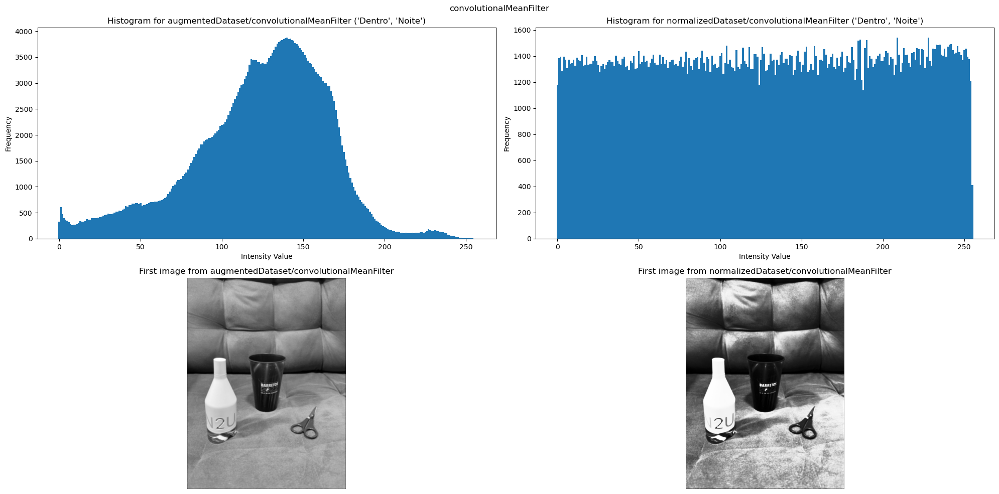

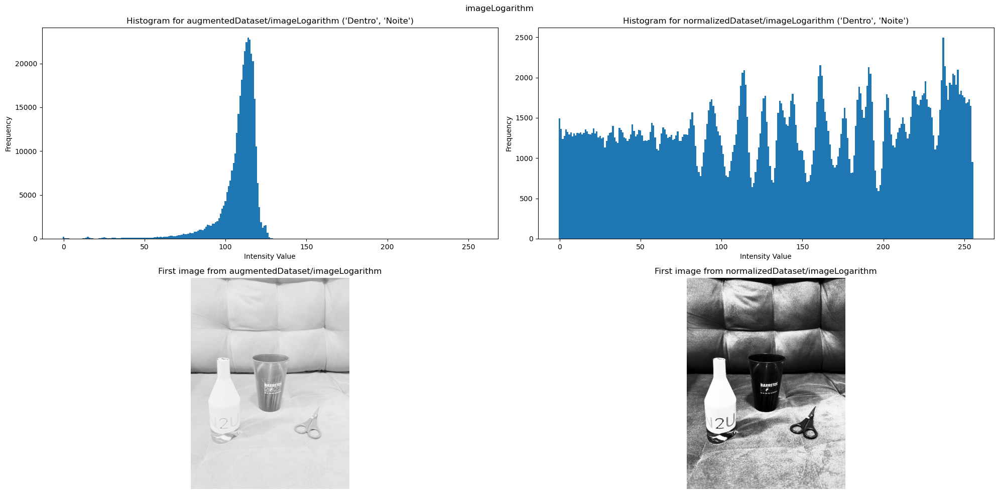

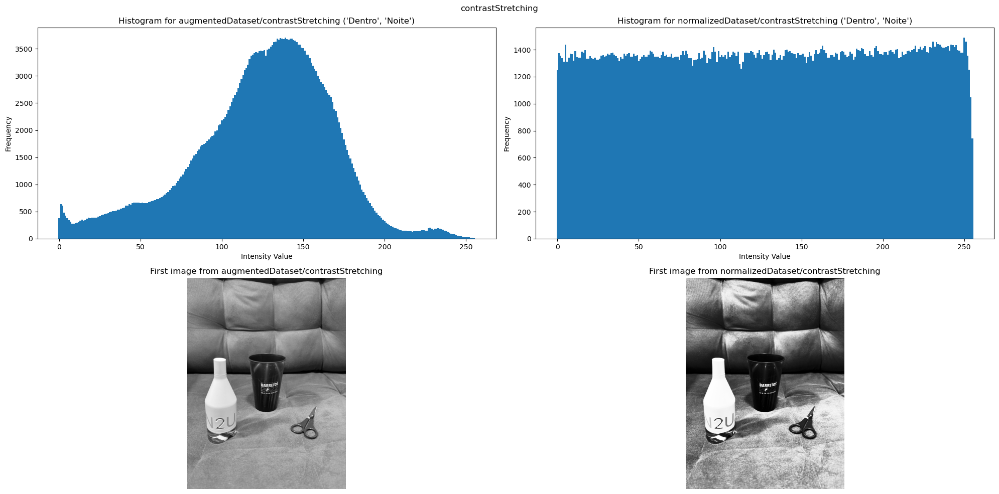

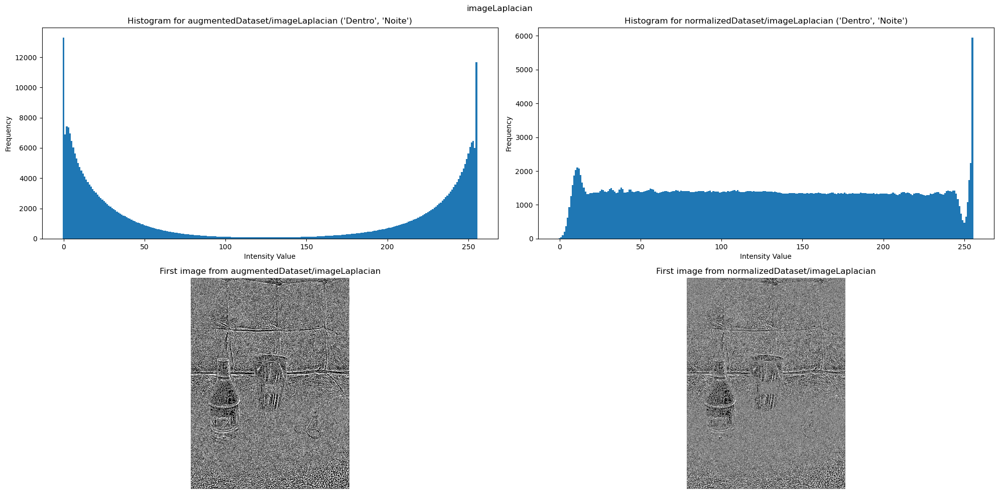

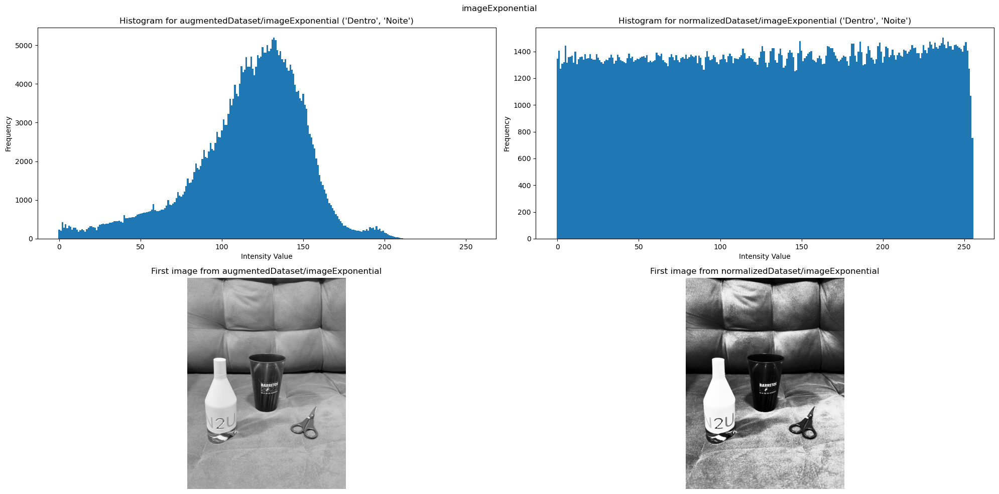

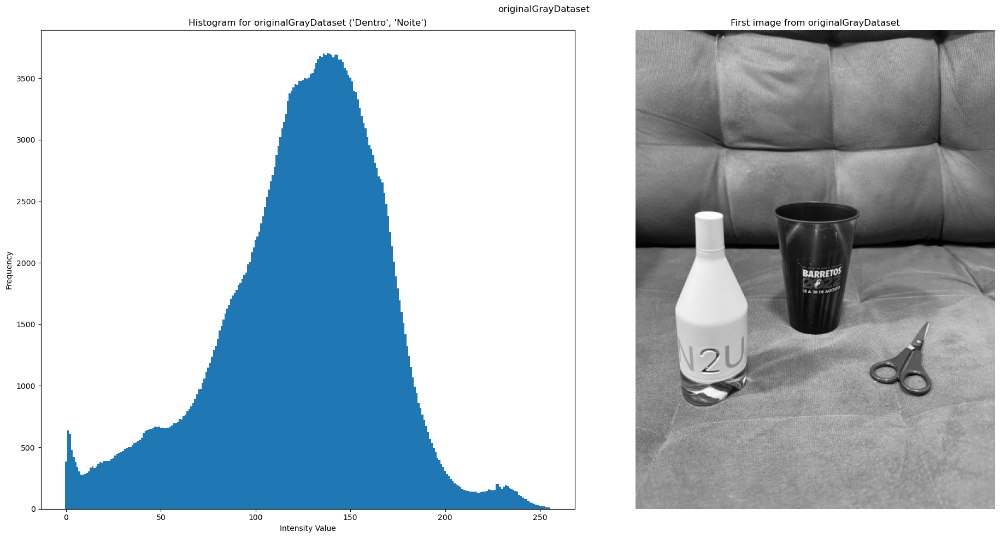

======================================== ('Fora', 'Dia') ========================================


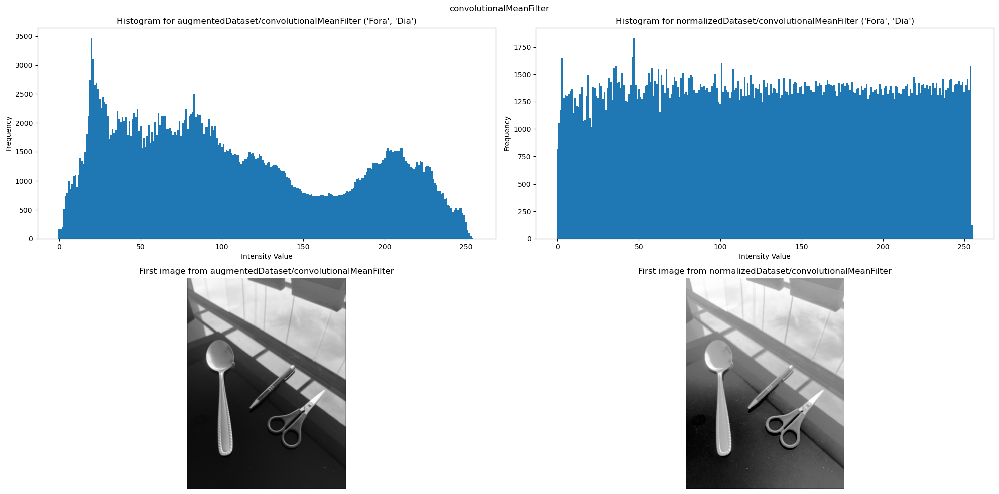

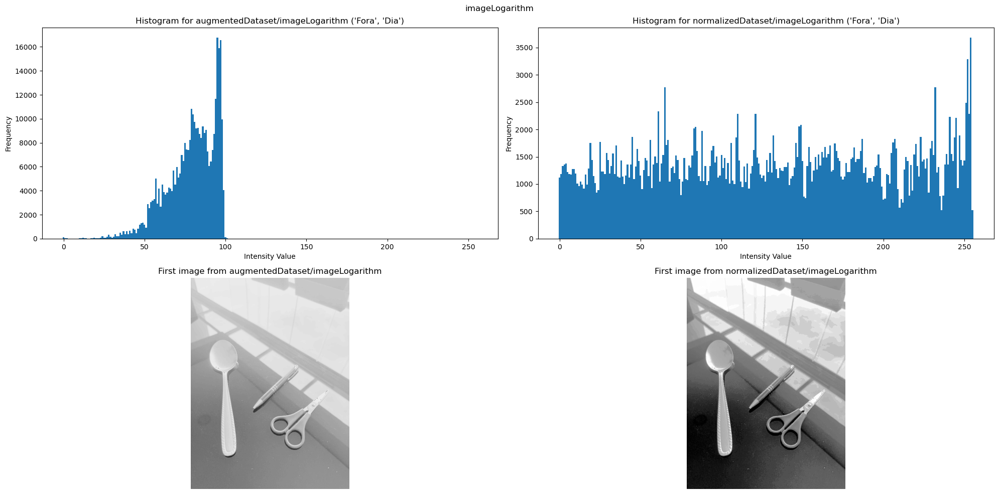

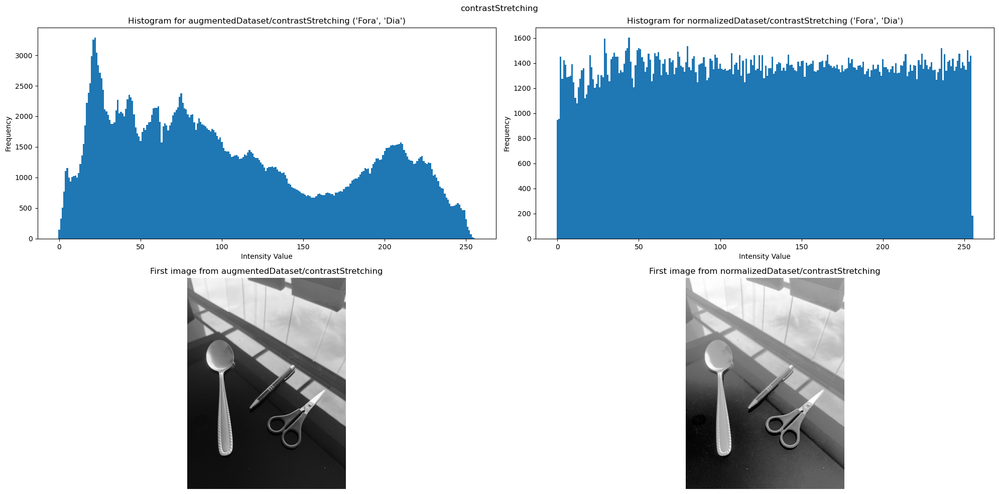

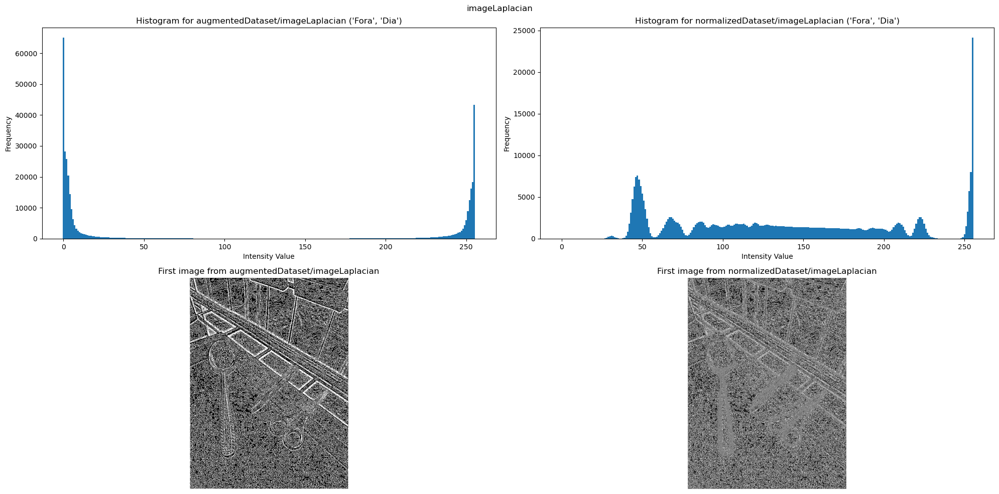

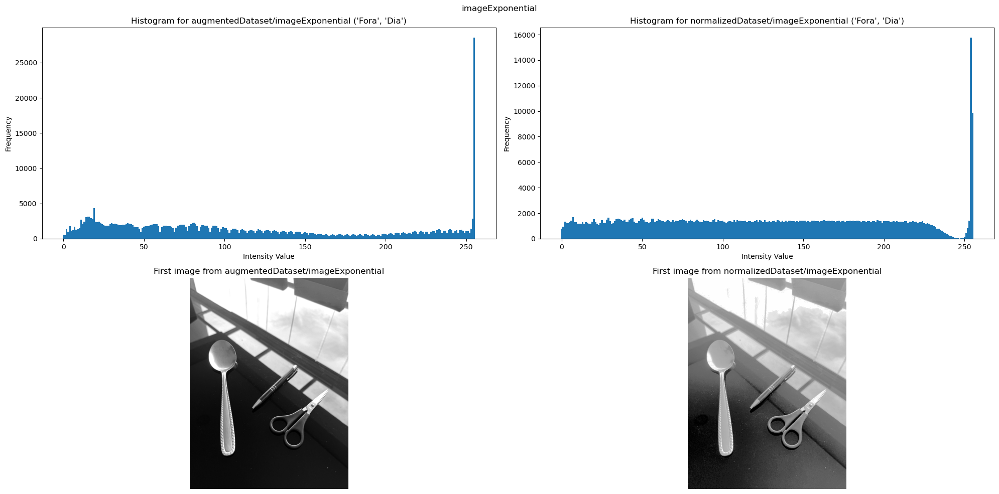

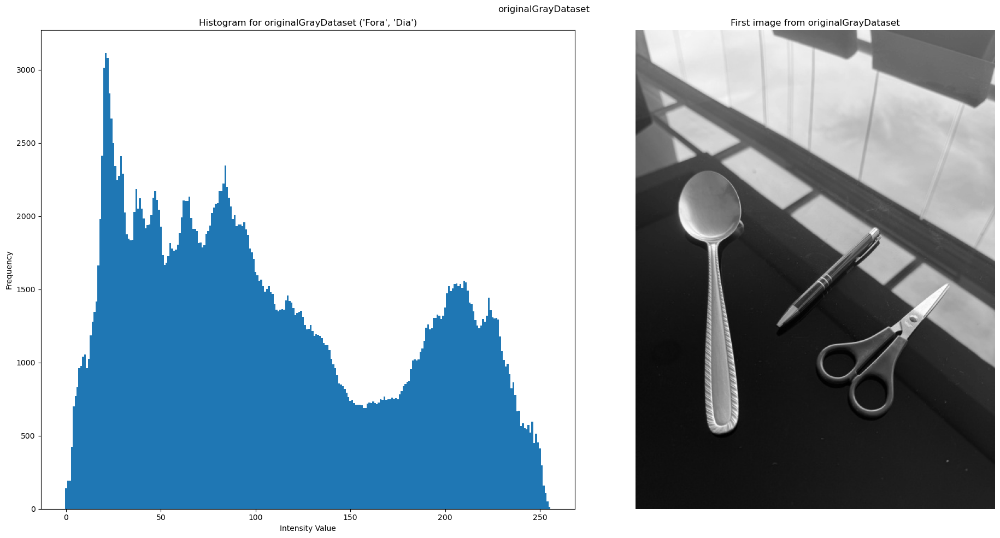

======================================== ('Fora', 'Noite') ========================================


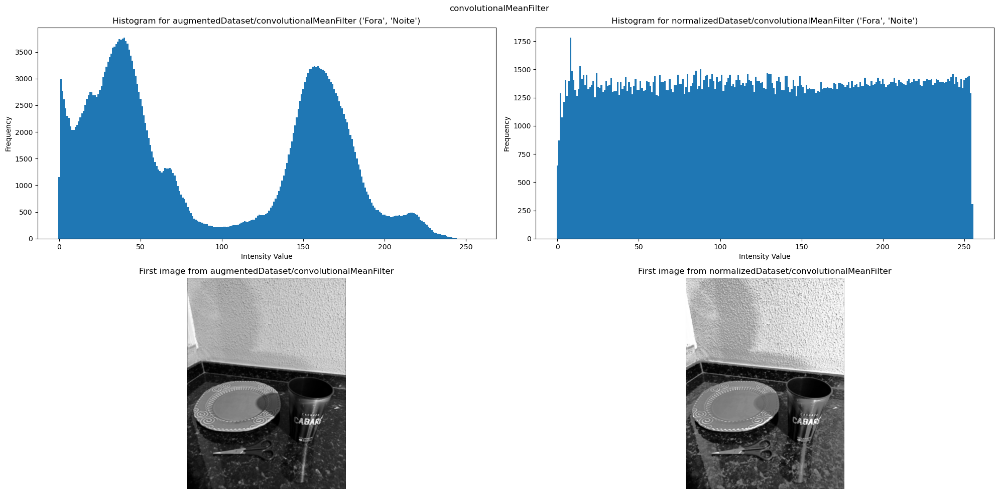

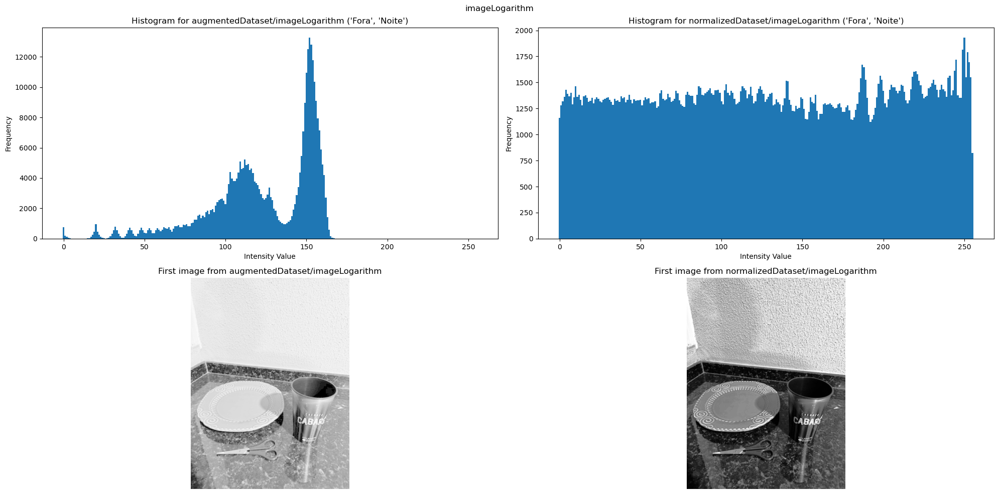

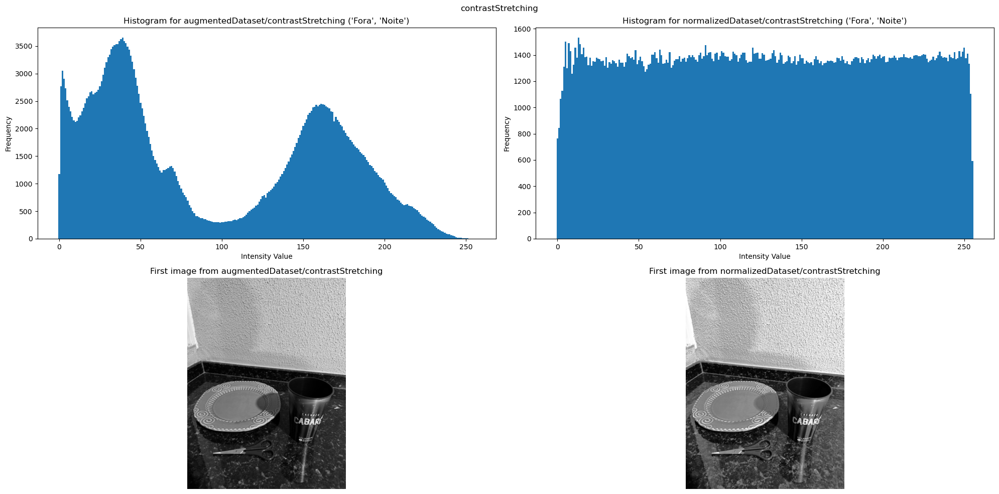

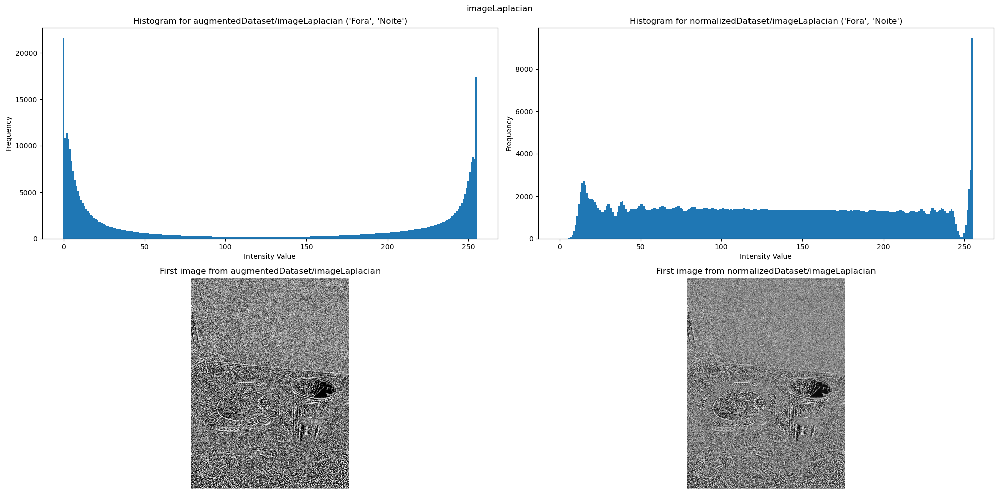

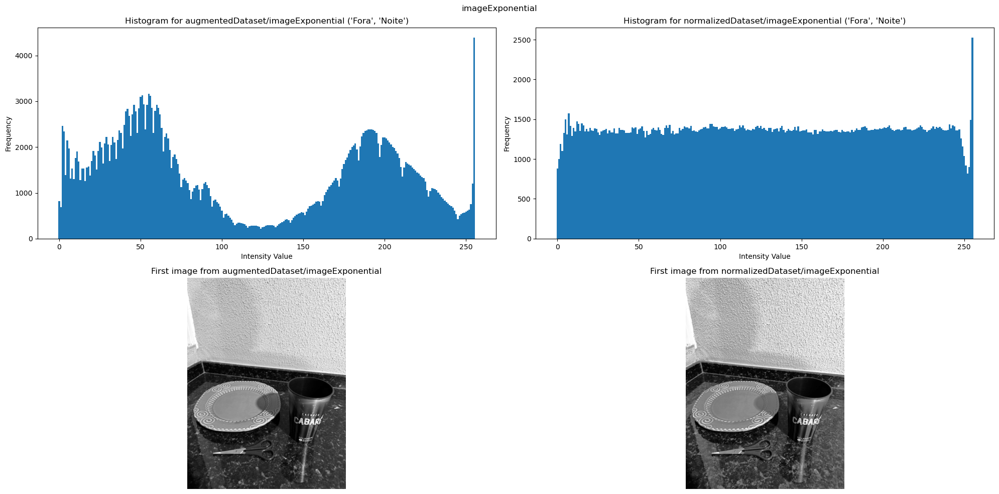

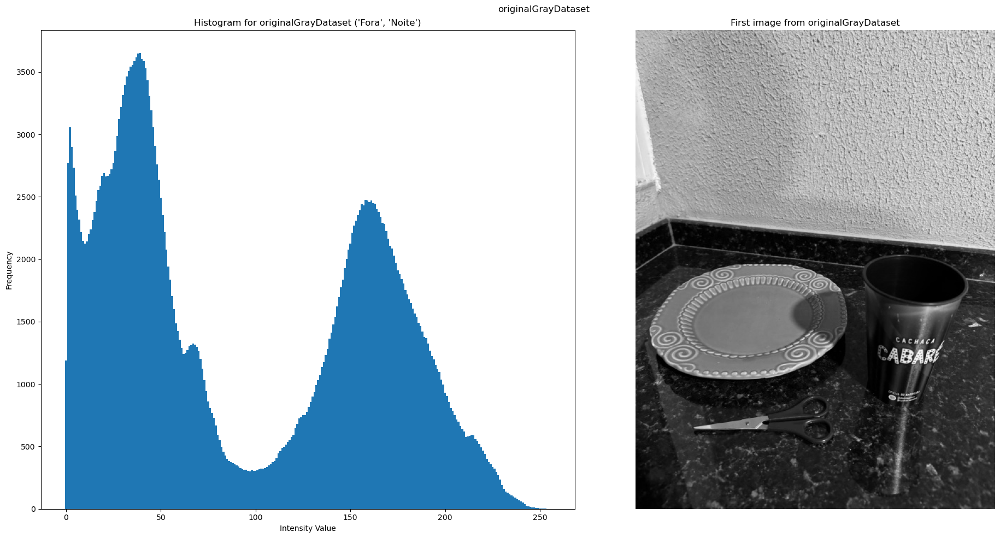

In [13]:
def plot_histogram(ax, hist, title):
    ax.bar(range(len(hist)), hist, width=1.0)
    ax.set_title(title)
    ax.set_xlabel('Intensity Value')
    ax.set_ylabel('Frequency')

def plot_all_histograms_and_images(main_folder_path):
    histograms_dict = process_main_folder(main_folder_path)

    dict_for_pairs = {}
    for lighting, list_of_tuples in histograms_dict.items():
        dict_for_pairs[lighting] = {}
        for tuple in list_of_tuples:
            title, hist, image = tuple
            title_parts = title.split("/")
            dict_key = title_parts[-1]
            if dict_key not in dict_for_pairs[lighting]:
                dict_for_pairs[lighting][dict_key] = []
            dict_for_pairs[lighting][dict_key].append(tuple)

    for lighting, dict_with_types in dict_for_pairs.items():
        print("\033[1m========================================", lighting, "========================================\033[0m")
        for type, list_of_tuples in dict_with_types.items():
            if len(list_of_tuples) <= 1:
                title, hist, image = list_of_tuples[0]
                fig, axes = plt.subplots(1, 2, figsize=(20, 10))
                plot_histogram(axes[0], hist, f'Histogram for {title} {lighting}')
                axes[1].imshow(image, cmap='gray')
                axes[1].set_title(f'First image from {title}')
                axes[1].axis('off')
            else:
                fig, axes = plt.subplots(2, len(list_of_tuples), figsize=(20, 10))
                for i, (title, hist, image) in enumerate(list_of_tuples):
                    plot_histogram(axes[0][i], hist, f'Histogram for {title} {lighting}')
                    axes[1][i].imshow(image, cmap='gray')
                    axes[1][i].set_title(f'First image from {title}')
                    axes[1][i].axis('off')

            plt.suptitle(f'{type}')
            plt.tight_layout()
            plt.show()

main_folder_path = './images'
plot_all_histograms_and_images(main_folder_path)

## Remarks

- **Obs. 1**: Na exibição das imagens acima, percebe-se um caso particular para as imagens em que foi aplicada a transformação logarítmica (mas ainda não a equalização do histograma): apesar de elas serem imagens mais escuras (o que pode ser visto pelos seus histogramas), a exibição delas acima foi automaticamente reescalada para que ficassem menos escuras. Não foi possível desfazer essa alteração. No entanto, conforme pode ser visto na imagem de exemplo abaixo, elas são, realmente, mais escuras, o que condiz com os seus histogramas. Nesse sentido, a alteração ocorre apenas na visualização.

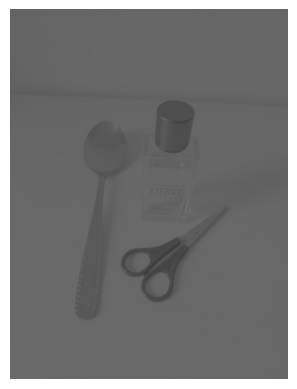

In [9]:
img = plt.imread("./images/augmentedDataset/imageLogarithm/image95.jpg")
plt.imshow(img)
plt.axis('off')
plt.show()

## Discussion

Primeiramente, pode-se discutir os efeitos da normalização que foram comuns para as diferentes iluminações. Percebe-se que as imagens que passaram pela transformação logarítmica, como suas intensidades passaram a se concentrar significativamente em níveis inferiores, a equalização do histograma melhorou significativamente a visualização dessas imagens: elas se tornaram menos escuras e com bem mais contraste.

Para as imagens que passaram pela transformação do Laplaciano, percebe-se que a equalização do histograma acabou prejudicando significativamente a visualização. Isso ocorreu porque o objetivo dessas imagens antes de serem normalizadas não era terem uma boa visualização e contraste em todas as partes da imagem, mas apenas nas regiões com grande mudança de intensidade (especialmente nas arestas de objetos).

Nesse sentido, de maneira geral (exceto pelas imagens do Laplaciano), a equalização do histograma, ao proporcionar um aumento de contraste nas imagens, muitas vezes beneficiou a visualização delas. Por outro lado, esse aumento de contraste também foi acompanhado, em algumas imagens, por um proporcional aumento de ruído.

Em segundo lugar, percebe-se que a equalização do histograma resultou em um comportamente esperado com relação aos histogramas: as intensidades passaram a ser distribuídas de maneira muito mais uniforme entre as possíveis intensidades. Esse era o efeito esperado da equalização do histograma.

Por fim, fazem-se algumas observações sobre os efeitos da equalização do histograma para cada iluminação:
- **(Dentro, Dia)**: Percebe-se que, originalmente, essas imagens eram consideravelmente claras e com baixo contraste (alta concentração de altas intensidades). Com isso, a equalização levou ao escurecimento de algumas partes da imagem, levando a um aumento significativo do contraste.
- **(Dentro, Noite)**: Nesse caso, as imagens tinham principalmente intensidades intermediárias (nem muito claras, nem muito escuras). Por conta disso, a equalização não levou a mudanças significativas da iluminação geral da imagem (apenas alterou algumas regiões dela). Por outro lado, as imagens originais tinham baixo contraste. Com isso, a equalização levou a um aumento significativo do contraste.
- **('Fora', 'Dia')**: Agora, apesar de as imagens terem sido capturadas em ambiente externo e durante o dia, os objetos foram posicionados em uma mesa preta. Por conta disso, as imagens já possuíam, originalmente, um contraste relevante, por conta de um fundo bastante claro e um suporte bastante escuro. Nesse sentido, viu-se um menor aumento de contraste em comparação com as outras iluminações. Por outro lado, algumas imagens deram mais destaque para a mesa escura, enquanto outras deram maior destaque para o fundo claro. Por conta disso, algumas imagens tornaram-se mais claras, enquanto outras tornaram-se mais escuras.
- **('Fora', 'Noite')**: Essas imagens foram as que, aparentemente, sofreram menores alterações, visto que elas originalmente já tinham bom contraste e não eram nem muito claras nem muito escuras. Ainda assim, houve um aumento na nitidez dos objetos.